In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics import mean_absolute_error, r2_score


In [2]:
%matplotlib inline 

In [3]:
df = pd.read_excel("X_bp.xlsx")
df.drop('Unnamed: 0', axis = 1, inplace = True)
df = df.iloc[22:]
df


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
22,4.029126,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000
23,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760
25,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556
26,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561
...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


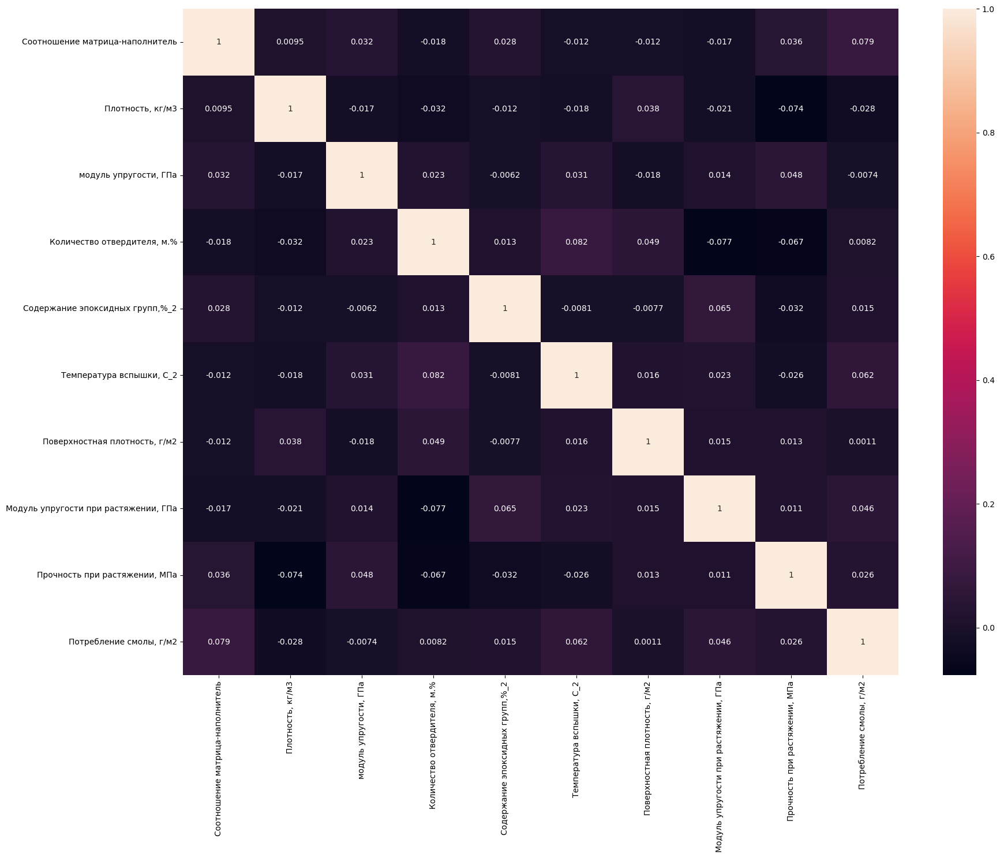

In [4]:
plt.figure(figsize=(20, 15)) 
sns.heatmap(df.corr(), annot=True)
plt.show()

In [5]:
df.duplicated().sum()
df[df.duplicated()]


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"


In [6]:
df.groupby(["Плотность, кг/м3", "модуль упругости, ГПа"]).size()


Плотность, кг/м3  модуль упругости, ГПа
1731.764635       664.058923               1
1740.657496       984.287951               1
1784.482245       975.846909               1
1786.035636       932.145606               1
1797.648234       807.064161               1
                                          ..
2182.751822       400.855580               1
2184.493200       933.368211               1
2192.297637       898.658996               1
2192.738783       611.766338               1
2207.773481       696.149163               1
Length: 1001, dtype: int64

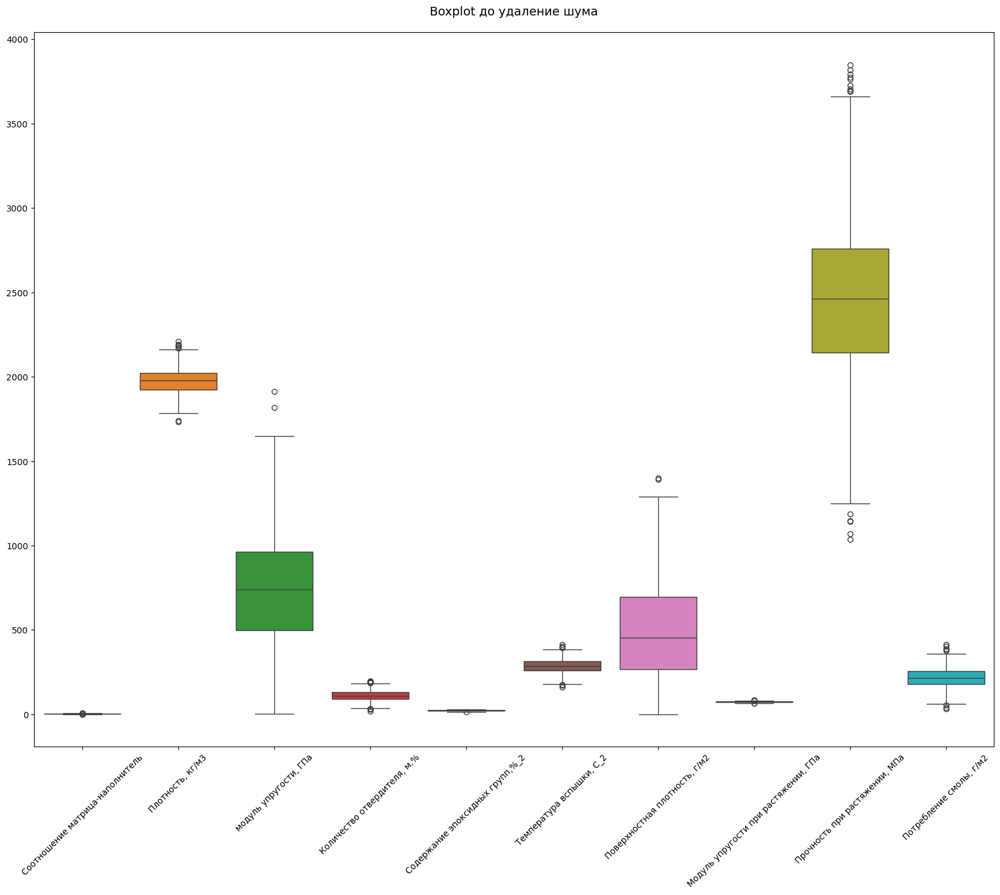

In [7]:
plt.figure(figsize=(20, 15)) 
plt.title("Boxplot до удаление шума", fontsize=14, pad=20)
sns.boxplot(data=df)
plt.xticks(rotation=45)  # Поворот подписей осей X для удобства
plt.show()

Построим бокс плот для визуализации распределения данных 

In [9]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Границы выбросов (можно умножить IQR на коэффициент, например 1.5)
lower_bound = Q1 - 1.3 * IQR
upper_bound = Q3 + 1.3 * IQR

df_trimmed = df.copy()
for col in df.select_dtypes(include=['number']):
    df_trimmed[col] = df[col].clip(lower_bound[col], upper_bound[col])

print(df_trimmed)

In [11]:
df_trimmed = df.copy()

for col in df.select_dtypes(include='number'):
    mean_val = df[col].mean()
    mask_outliers = (df[col] < lower_bound[col]) | (df[col] > upper_bound[col])
    df_trimmed.loc[mask_outliers, col] = mean_val


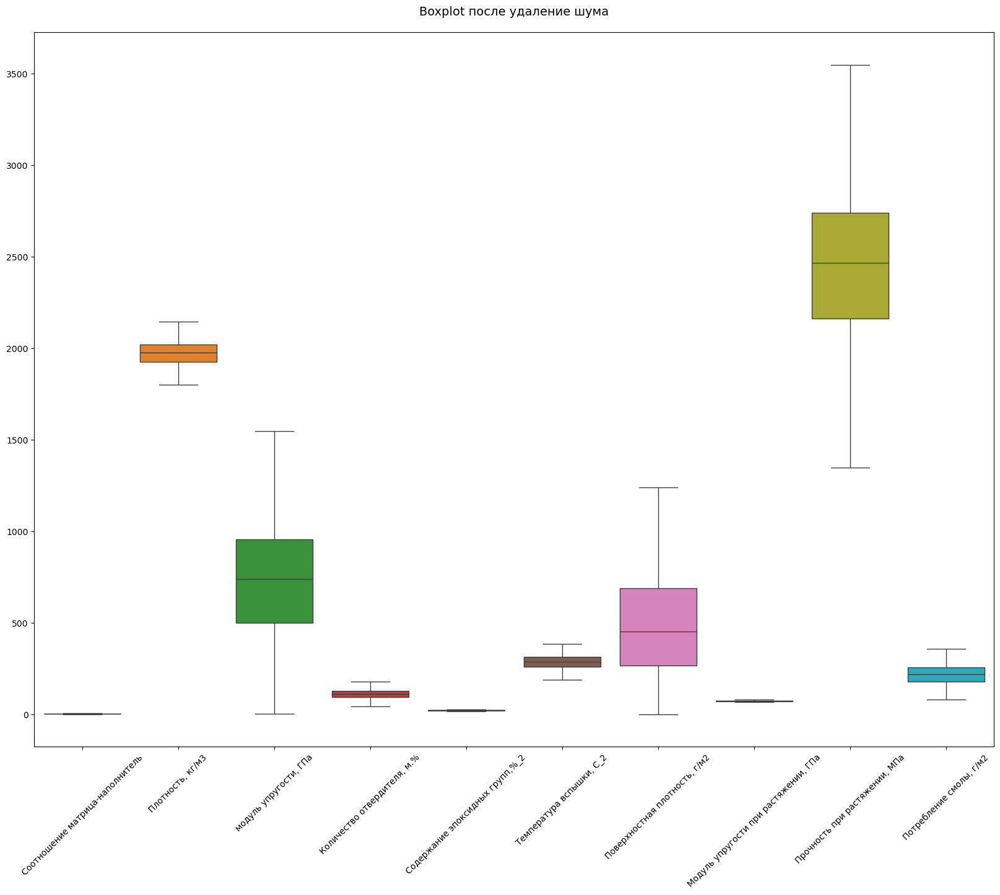

In [12]:
plt.figure(figsize=(20, 15)) 
plt.title("Boxplot после удаление шума", fontsize=14, pad=20)
sns.boxplot(data=df_trimmed)
plt.xticks(rotation=45)  # Поворот подписей осей X для удобства
plt.show()

In [13]:
df_trimmed.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
count,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000
mean,2.924276,1974.231795,734.124704,110.586720,22.244611,285.698889,479.576529,73.279339,2457.734779,218.924219
std,0.870832,68.950768,321.637592,26.180101,2.329930,39.105932,275.313799,2.941249,435.512998,56.549604
min,0.749223,1801.940695,2.436909,43.132583,16.391595,187.562353,0.603740,66.052747,1348.288251,82.583161
25%,2.337851,1925.610616,498.519344,92.922201,20.583309,259.141151,268.217818,71.335982,2160.577394,180.410124
50%,2.918289,1975.571219,739.832687,110.542434,22.243874,285.909992,453.919475,73.328467,2466.925422,218.388487
75%,3.540806,2019.601135,956.971948,129.442140,23.962165,312.790306,690.364836,75.280332,2740.229631,256.784428
max,5.120368,2145.260352,1546.290886,179.645962,28.324968,383.938404,1238.476416,80.419862,3548.054731,359.052220


In [14]:
df_trimmed

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
22,4.029126,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000
23,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,73.328467,2587.342983,246.613117
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,2467.172673,226.222760
25,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556
26,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561
...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [15]:
df_trimmed['Соотношение матрица-наполнитель'].mean()

2.9242755074444924

In [16]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
X_scaled = scaler.fit_transform(df_trimmed)


In [17]:
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(df_x) 
df_s2 = pd.DataFrame(X_scaled, columns=['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении ГПа', 'Прочность при растяжении МПа','Потребление смолы, г/м2',])
df_s2

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",Модуль упругости при растяжении ГПа,Прочность при растяжении МПа,"Потребление смолы, г/м2"
0,0.923424,-1.016818,-0.257023,0.036078,0.007098,-0.024131,0.038092,0.001234,-0.019615,0.021100
1,-0.275107,-0.237219,0.865440,0.741649,0.029791,-0.954220,0.241560,0.000000,0.207741,0.369557
2,-0.347786,-0.350838,0.352680,0.977816,0.247978,1.217575,0.973135,0.722453,0.000427,0.102577
3,-0.724730,0.660286,-0.070371,-0.244392,0.267108,0.492034,0.221917,0.123873,0.271026,-0.526223
4,-0.882671,0.453760,0.210407,0.680704,1.240550,0.775415,-0.717660,0.984267,0.010803,-1.244449
...,...,...,...,...,...,...,...,...,...,...
996,-0.537795,-0.249848,0.377406,-0.644860,-0.627616,0.724421,-0.579705,-0.060214,-0.137381,-1.222673
997,0.437035,0.792824,-0.643687,0.970416,-0.782544,-0.590775,-0.244604,-0.103348,-0.183787,-1.317961
998,0.301188,-0.034028,-0.704536,-0.000245,0.507162,-0.698743,0.678018,0.356428,0.338100,0.238539
999,0.654274,0.970614,0.003583,0.844895,-0.886965,-0.188822,0.444273,0.181080,-0.681805,-0.278398


5169.250661222852


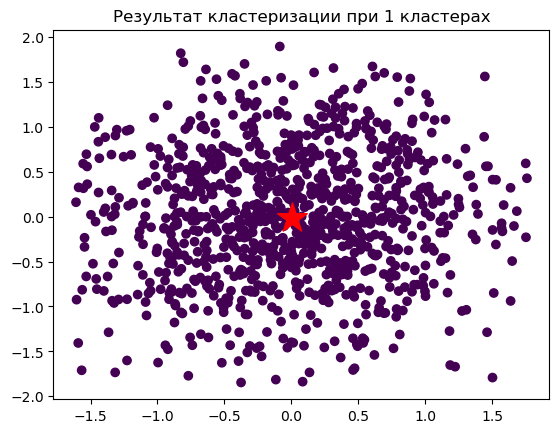

4766.9840013299345


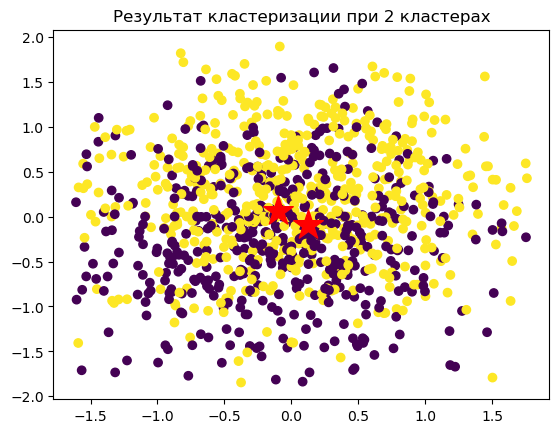

4467.533860656743


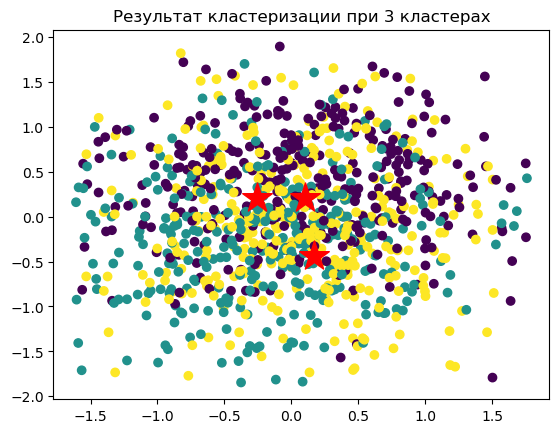

4271.039728314394


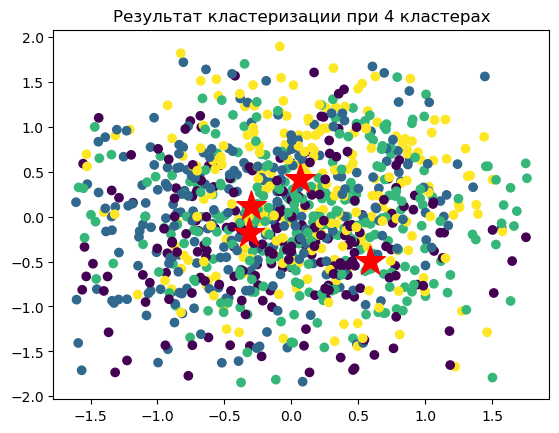

4119.059306414374


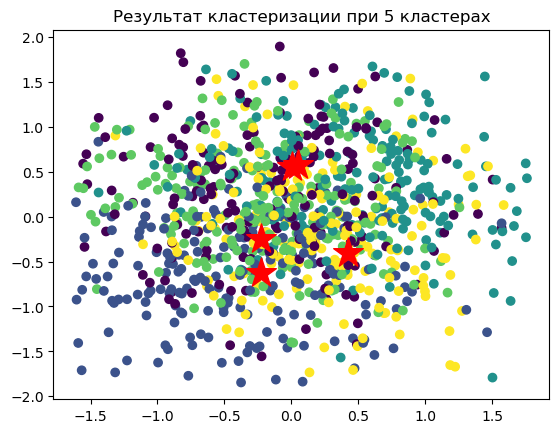

3984.659727192091


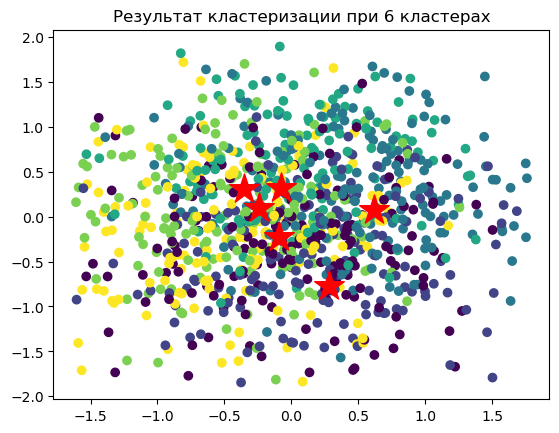

3850.144103377431


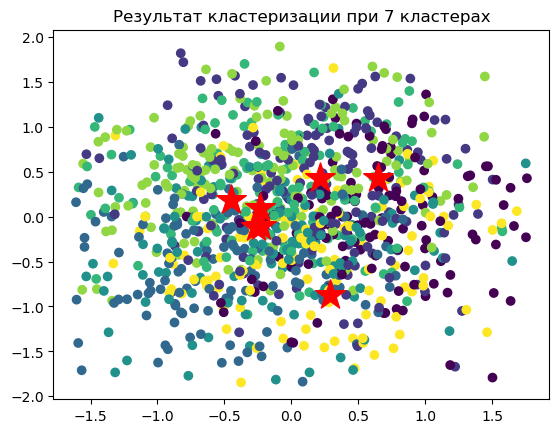

3747.29764815503


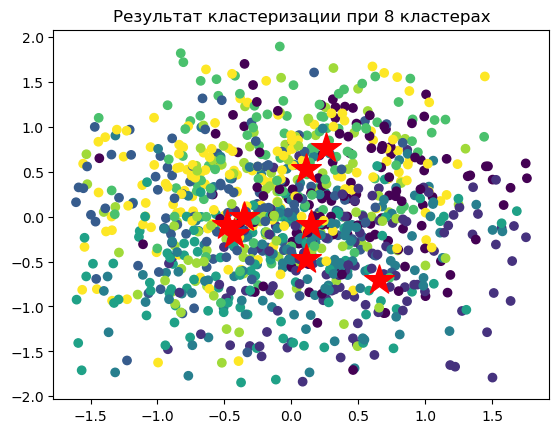

3646.7641494006984


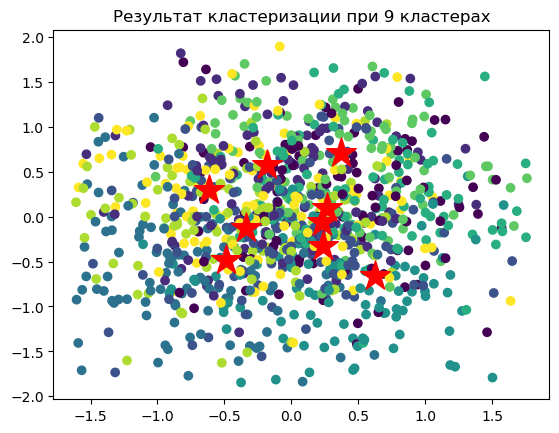

3571.134936956438


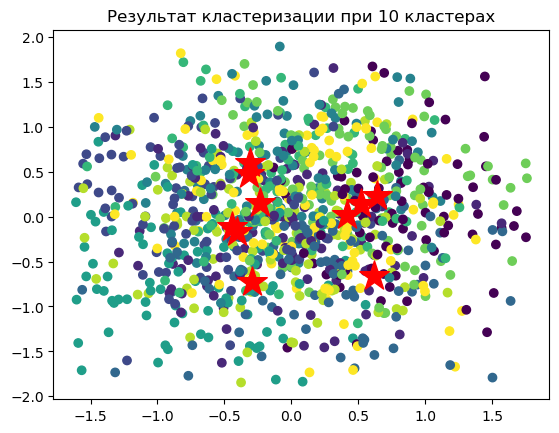

3496.822540503442


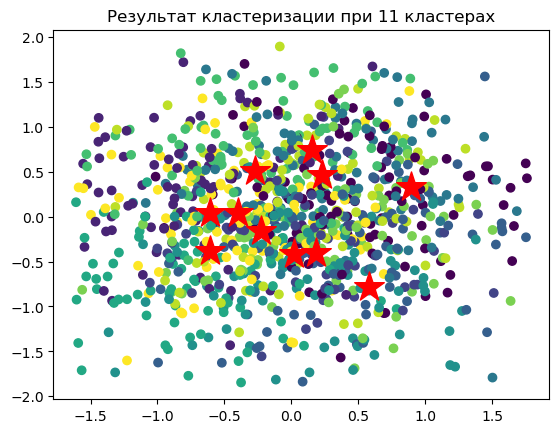

3422.375430485283


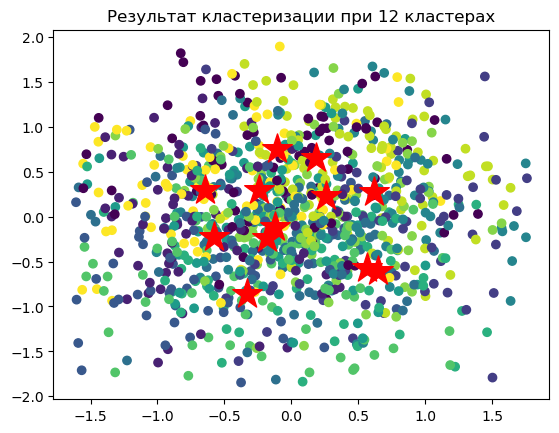

3379.5393086119184


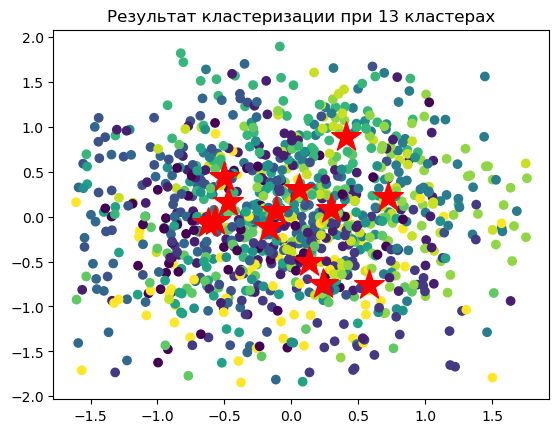

3348.1309733190915


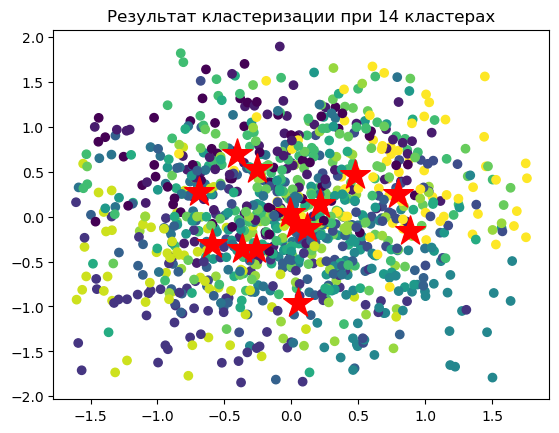

In [18]:
distortions = []
count_of_clusters = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++')

    kmeans_prediction = kmeans.fit_predict(X_scaled)

    
    distortions.append(kmeans.inertia_)
    print(kmeans.inertia_)
    count_of_clusters.append(i)

    plt.title(f"Результат кластеризации при {i} кластерах")
    plt.scatter(X_scaled[:, 2], X_scaled[:, 3], c = kmeans_prediction)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
            marker="*", s=500, color='r')
    plt.show()

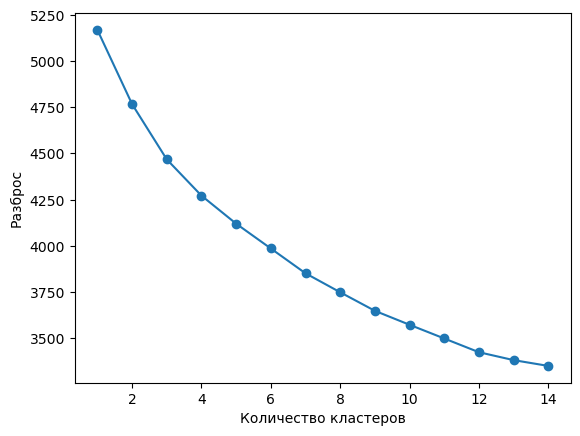

In [19]:
plt.plot(count_of_clusters, distortions, marker='o')
plt.xlabel('Количество кластеров')
plt.ylabel('Разброс')
plt.show()

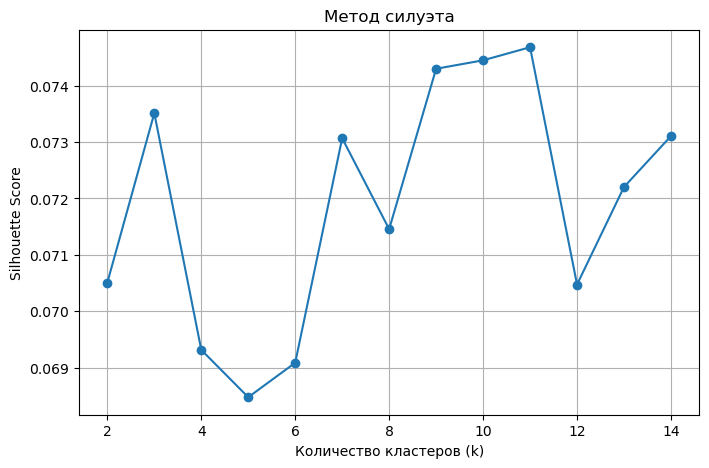

In [20]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    silhouette_scores.append(score)

# Построение графика силуэта
plt.figure(figsize=(8, 5))
plt.plot(range(2, 15), silhouette_scores, marker='o')
plt.xlabel('Количество кластеров (k)')
plt.ylabel('Silhouette Score')
plt.title('Метод силуэта')
plt.grid()
plt.show()

In [21]:
kmeans = KMeans(
    n_clusters=6,
    init='k-means++',
    n_init=20,   # или число, например 20
    max_iter=300,
    random_state=42
)
kmeans.fit(X_scaled)
kmeans_prediction = kmeans.predict(X_scaled)
kmeans_prediction

array([3, 3, 0, ..., 3, 1, 3], dtype=int32)

In [22]:
data_viz = X_scaled.copy()
df_s = pd.DataFrame(data_viz, columns=['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении ГПа', 'Прочность при растяжении МПа','Потребление смолы, г/м2',])
df_s['Cluster'] = kmeans_prediction
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",Модуль упругости при растяжении ГПа,Прочность при растяжении МПа,"Потребление смолы, г/м2",Cluster
0,0.923424,-1.016818,-0.257023,0.036078,0.007098,-0.024131,0.038092,0.001234,-0.019615,0.021100,3
1,-0.275107,-0.237219,0.865440,0.741649,0.029791,-0.954220,0.241560,0.000000,0.207741,0.369557,3
2,-0.347786,-0.350838,0.352680,0.977816,0.247978,1.217575,0.973135,0.722453,0.000427,0.102577,0
3,-0.724730,0.660286,-0.070371,-0.244392,0.267108,0.492034,0.221917,0.123873,0.271026,-0.526223,5
4,-0.882671,0.453760,0.210407,0.680704,1.240550,0.775415,-0.717660,0.984267,0.010803,-1.244449,5
...,...,...,...,...,...,...,...,...,...,...,...
996,-0.537795,-0.249848,0.377406,-0.644860,-0.627616,0.724421,-0.579705,-0.060214,-0.137381,-1.222673,5
997,0.437035,0.792824,-0.643687,0.970416,-0.782544,-0.590775,-0.244604,-0.103348,-0.183787,-1.317961,5
998,0.301188,-0.034028,-0.704536,-0.000245,0.507162,-0.698743,0.678018,0.356428,0.338100,0.238539,3
999,0.654274,0.970614,0.003583,0.844895,-0.886965,-0.188822,0.444273,0.181080,-0.681805,-0.278398,1


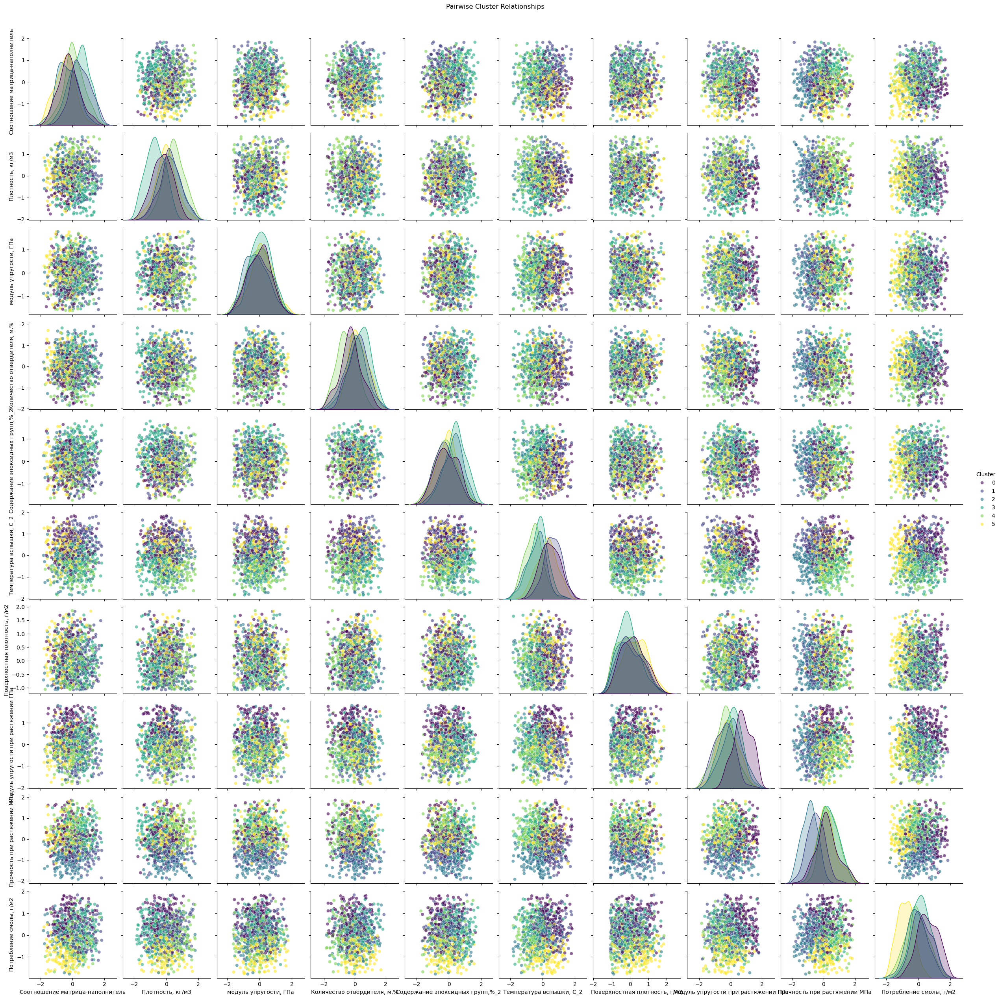

In [23]:
# Строим попарные графики
sns.pairplot(df_s, hue='Cluster', palette='viridis', plot_kws={'alpha':0.6})
plt.suptitle("Pairwise Cluster Relationships", y=1.02)
plt.show()

In [24]:
df_s.head(5)


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",Модуль упругости при растяжении ГПа,Прочность при растяжении МПа,"Потребление смолы, г/м2",Cluster
0,0.923424,-1.016818,-0.257023,0.036078,0.007098,-0.024131,0.038092,0.001234,-0.019615,0.021100,3
1,-0.275107,-0.237219,0.865440,0.741649,0.029791,-0.954220,0.241560,0.000000,0.207741,0.369557,3
2,-0.347786,-0.350838,0.352680,0.977816,0.247978,1.217575,0.973135,0.722453,0.000427,0.102577,0
3,-0.724730,0.660286,-0.070371,-0.244392,0.267108,0.492034,0.221917,0.123873,0.271026,-0.526223,5
4,-0.882671,0.453760,0.210407,0.680704,1.240550,0.775415,-0.717660,0.984267,0.010803,-1.244449,5


In [25]:
df_s['Cluster'].unique()

array([3, 0, 5, 1, 4, 2], dtype=int32)

Разобъем набор на обучающий и проверочный

In [27]:
df_y= df_trimmed.iloc[:,0]
df_x = df_trimmed.drop(['Соотношение матрица-наполнитель'], axis = 1)
df_x['Cluster'] = kmeans_prediction
df_x

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Cluster
22,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,3
23,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,73.328467,2587.342983,246.613117,3
24,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,2467.172673,226.222760,0
25,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,5
26,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561,5
...,...,...,...,...,...,...,...,...,...,...
1018,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,5
1019,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,5
1020,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,3
1021,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1


In [28]:
X_train, X_test, Y_train, Y_test = train_test_split(df_x,df_y, test_size = 0.3, shuffle=True, random_state = 0)

In [29]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
import pandas as pd
import numpy as np

# 2. OneHot Encoding
train_index = X_train.index
test_index = X_test.index
#encoder = OneHotEncoder(sparse_output=False, drop='first')
encoder = OneHotEncoder(sparse_output=False,)
cluster_encoded_train = encoder.fit_transform(X_train[['Cluster']])
cluster_encoded_test = encoder.transform(X_test[['Cluster']])
feature_names = encoder.get_feature_names_out(['Cluster'])
cluster_train_df = pd.DataFrame(cluster_encoded_train, columns=feature_names,index=train_index)
cluster_test_df = pd.DataFrame(cluster_encoded_test, columns=feature_names,index=test_index)
X_train_encoded = pd.concat([
    X_train.drop('Cluster', axis=1),
    cluster_train_df
], axis=1)

X_test_encoded = pd.concat([
    X_test.drop('Cluster', axis=1),
    cluster_test_df
], axis=1)
# 6. Проверяем размерности
print("Форма X_train_encoded:", X_train_encoded.shape)
print("Форма cluster_encoded_train:", cluster_encoded_train.shape)
print("Названия столбцов:", feature_names)
cluster_train_df.head(5)

Форма X_train_encoded: (700, 15)
Форма cluster_encoded_train: (700, 6)
Названия столбцов: ['Cluster_0' 'Cluster_1' 'Cluster_2' 'Cluster_3' 'Cluster_4' 'Cluster_5']


,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5
90,0.0,0.0,0.0,0.0,0.0,1.0
503,0.0,0.0,1.0,0.0,0.0,0.0
641,0.0,0.0,1.0,0.0,0.0,0.0
458,0.0,1.0,0.0,0.0,0.0,0.0
280,0.0,0.0,0.0,1.0,0.0,0.0


In [30]:
cluster_train_df.head(5)

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5
90,0.0,0.0,0.0,0.0,0.0,1.0
503,0.0,0.0,1.0,0.0,0.0,0.0
641,0.0,0.0,1.0,0.0,0.0,0.0
458,0.0,1.0,0.0,0.0,0.0,0.0
280,0.0,0.0,0.0,1.0,0.0,0.0


In [31]:
X_train.head(5)

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Cluster
90,1924.864832,957.378290,116.753626,21.978814,334.333067,679.950217,67.026508,2133.591147,111.056523,5
503,2088.013591,923.421474,110.542434,23.119301,251.997689,59.939393,77.627654,2149.657181,218.388487,2
641,1887.288244,1192.344813,122.378495,24.520994,306.206028,668.451348,72.976124,1493.801335,180.644374,2
458,1990.495542,667.836803,80.474542,24.998201,330.675199,402.772337,68.976466,2511.373624,295.458299,1
280,2005.412966,414.375364,131.173357,24.666328,260.705547,485.516113,70.838307,2482.710947,283.367708,3


In [32]:
X_test_encoded.head(5)

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5
730,1898.891452,833.367763,103.012602,22.394169,296.604337,535.406493,77.856284,2605.463153,305.376981,1.0,0.0,0.0,0.0,0.0,0.0
555,1855.696228,82.278818,134.242529,22.557155,340.150827,144.313211,70.273946,2555.637336,174.729538,0.0,0.0,0.0,0.0,0.0,1.0
320,1931.881912,1110.896831,62.620924,25.334082,294.211396,362.407115,76.493768,2787.386492,136.548332,0.0,0.0,0.0,1.0,0.0,0.0
378,1925.610616,992.760436,88.383137,22.147630,285.909992,951.222629,76.210116,2781.540025,127.652751,0.0,0.0,0.0,0.0,0.0,1.0
855,2093.942436,895.989279,112.455777,19.794533,258.799346,322.790206,73.493749,2736.782713,196.870502,0.0,0.0,0.0,0.0,1.0,0.0


In [33]:
Y_train

90     2.143617
503    1.367585
641    2.770720
458    2.127935
280    3.678477
         ...   
857    3.359442
214    1.544947
651    2.701910
581    2.196740
706    2.921002
Name: Соотношение матрица-наполнитель, Length: 700, dtype: float64

In [34]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

In [35]:
X_train_encoded_np = X_train_encoded.values 
X_train_encoded_np
print(X_train_encoded_np.shape)



(700, 15)


In [36]:
normalizer = tf.keras.layers.Normalization(axis=-1)
print(X_train_encoded_np.shape)  # должно быть (n_samples, n_features)
normalizer.adapt(X_train_encoded_np)
normalizer
print("Mean:", normalizer.mean.numpy())
print("Variance:", normalizer.variance.numpy())


(700, 15)
Mean: [[1.9765836e+03 7.3680847e+02 1.1076961e+02 2.2275587e+01 2.8659692e+02
  4.8560391e+02 7.3207077e+01 2.4621274e+03 2.1993060e+02 1.5285714e-01
  1.6714285e-01 1.6000000e-01 1.9000000e-01 1.7428571e-01 1.5571429e-01]]
Variance: [[4.7711035e+03 9.8717883e+04 6.6577051e+02 5.5629821e+00 1.6071985e+03
  7.6052117e+04 8.5670090e+00 1.8375239e+05 3.2972961e+03 1.2949184e-01
  1.3920613e-01 1.3440000e-01 1.5390000e-01 1.4391020e-01 1.3146734e-01]]


In [37]:
X_train_encoded_np[:1]

array([[1.92486483e+03, 9.57378290e+02, 1.16753626e+02, 2.19788141e+01,
        3.34333067e+02, 6.79950217e+02, 6.70265082e+01, 2.13359115e+03,
        1.11056523e+02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [44]:
first = np.array(X_train_encoded_np[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[1924.86  957.38  116.75   21.98  334.33  679.95   67.03 2133.59  111.06
     0.      0.      0.      0.      0.      1.  ]]

Normalized: [[-0.75  0.7   0.23 -0.13  1.19  0.7  -2.11 -0.77 -1.9  -0.42 -0.45 -0.44
  -0.48 -0.46  2.33]]


In [46]:
dnn_model1 = keras.Sequential([
      normalizer,
      layers.Dense(64, activation='relu'),
      layers.Dense(32, activation='relu'),
      layers.Dense(64, activation='relu'),
      #layers.Dense(32, activation='relu'),
      layers.Dense(1)
  ])

dnn_model1.compile(loss='mse',
                optimizer=tf.keras.optimizers.Adam(0.001))
 

In [48]:
%%time
history = dnn_model1.fit(
    X_train_encoded, Y_train,
    validation_split=0.2,
    verbose=0, epochs=50)

CPU times: user 1.39 s, sys: 308 ms, total: 1.7 s
Wall time: 1.34 s


In [50]:
dnn_model1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ normalization (Normalization)   │ (None, 15)             │            31 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,876 (62.02 KB)

 Trainable params: 5,281 (20.63 KB)

 Non-trainable params: 31 (128.00 B)

 Optimizer params: 10,564 (41.27 KB)

In [52]:
X_test_encoded

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5
730,1898.891452,833.367763,103.012602,22.394169,296.604337,535.406493,77.856284,2605.463153,305.376981,1.0,0.0,0.0,0.0,0.0,0.0
555,1855.696228,82.278818,134.242529,22.557155,340.150827,144.313211,70.273946,2555.637336,174.729538,0.0,0.0,0.0,0.0,0.0,1.0
320,1931.881912,1110.896831,62.620924,25.334082,294.211396,362.407115,76.493768,2787.386492,136.548332,0.0,0.0,0.0,1.0,0.0,0.0
378,1925.610616,992.760436,88.383137,22.147630,285.909992,951.222629,76.210116,2781.540025,127.652751,0.0,0.0,0.0,0.0,0.0,1.0
855,2093.942436,895.989279,112.455777,19.794533,258.799346,322.790206,73.493749,2736.782713,196.870502,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911,2057.091178,738.957167,143.639639,24.925607,325.004867,379.873439,72.055086,2370.570518,201.221869,0.0,1.0,0.0,0.0,0.0,0.0
496,1849.281282,1267.641202,93.619944,27.047601,275.989489,493.624551,70.286940,2294.627295,202.784931,0.0,0.0,0.0,1.0,0.0,0.0
438,2011.351029,386.740062,118.954187,23.695821,292.359254,324.058951,76.564019,2741.401228,168.829524,0.0,0.0,0.0,0.0,0.0,1.0
32,2010.047012,339.550423,67.498993,24.280609,254.949084,117.535234,67.478707,2462.605386,207.018581,0.0,0.0,0.0,0.0,1.0,0.0


In [54]:
y_pred = dnn_model1.predict(X_test_encoded)  # Предсказанные значения

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


In [56]:
y_pred

array([[2.520474 ],
       [2.2442987],
       [4.8955216],
       [2.9914396],
       [2.8989642],
       [3.5124815],
       [3.325779 ],
       [1.8831767],
       [3.08602  ],
       [4.13552  ],
       [2.2515557],
       [3.6709418],
       [3.1870527],
       [3.5058696],
       [3.0292966],
       [3.2739363],
       [3.8916147],
       [2.4648936],
       [2.020797 ],
       [2.3536327],
       [1.8199667],
       [2.7889698],
       [3.689903 ],
       [3.0838323],
       [3.134262 ],
       [1.9482955],
       [2.9619186],
       [1.9044863],
       [2.303986 ],
       [2.7613444],
       [2.0229652],
       [2.831374 ],
       [2.454445 ],
       [2.7043903],
       [3.6627333],
       [2.3374846],
       [2.9190557],
       [2.8035302],
       [2.1066842],
       [2.6176221],
       [2.9030466],
       [2.365534 ],
       [2.0936615],
       [2.5505471],
       [2.0049353],
       [2.0243852],
       [3.2825787],
       [2.1266453],
       [3.7833183],
       [2.9065592],


In [58]:
plot_loss(history)
plt.show()

NameError: name 'plot_loss' is not defined

In [60]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Средняя абсолютная ошибка (MAE)
mae = mean_absolute_error(Y_test, y_pred)

# Среднеквадратичная ошибка (MSE и RMSE)
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)

# Коэффициент детерминации (R²)
r2 = r2_score(Y_test, y_pred)

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.2f}")

MAE: 0.64
RMSE: 0.81
R²: 0.10


In [ ]:
Y_test

In [ ]:
y_pred

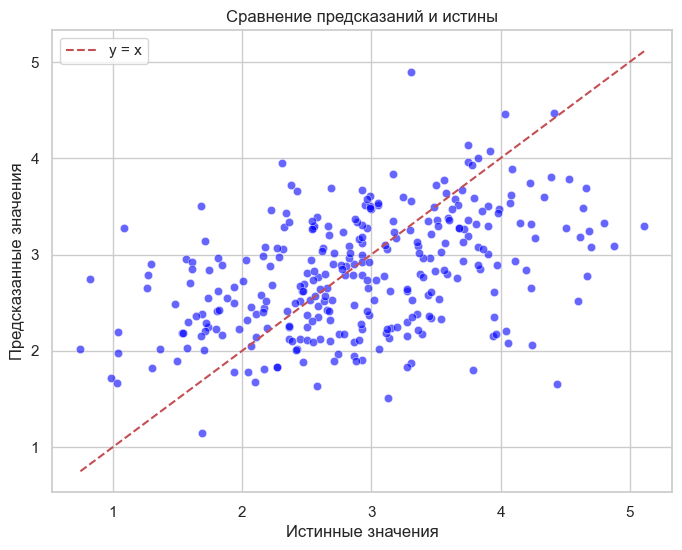

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Преобразуем к одномерному виду
y_test_1d = np.ravel(Y_test)
y_pred_1d = np.ravel(y_pred)

sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_1d, y=y_pred_1d, color='blue', alpha=0.6)

# Линия идеального совпадения
min_val = min(y_test_1d.min(), y_pred_1d.min())
max_val = max(y_test_1d.max(), y_pred_1d.max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='y = x')

plt.xlabel("Истинные значения")
plt.ylabel("Предсказанные значения")
plt.title("Сравнение предсказаний и истины")
plt.legend()
plt.show()

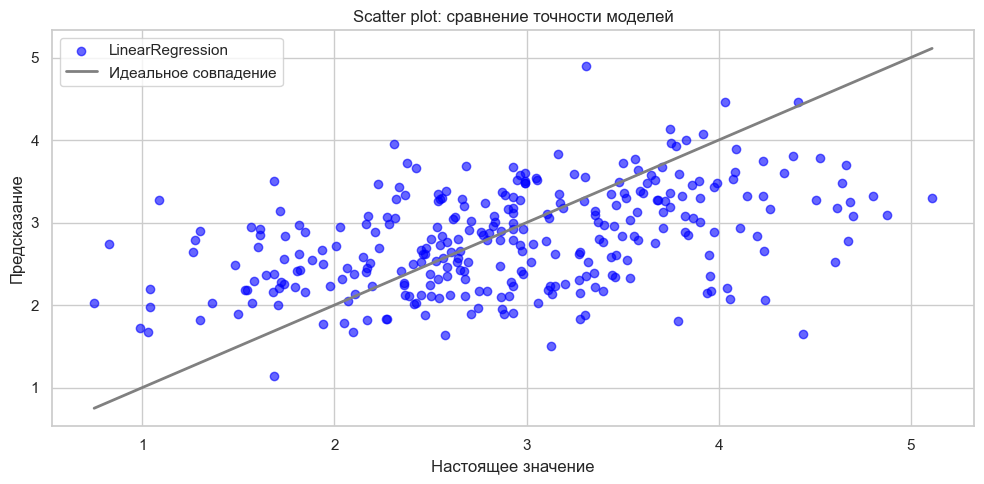

In [64]:
plt.figure(figsize=(10, 5))

plt.scatter(Y_test, y_pred, label="LinearRegression", alpha=0.6, color='blue')


plt.plot([Y_test.min(), Y_test.max()],
         [Y_test.min(), Y_test.max()],
         color='gray', linewidth=2, label='Идеальное совпадение')

plt.xlabel("Настоящее значение")
plt.ylabel("Предсказание")
plt.title("Scatter plot: сравнение точности моделей")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [68]:
from tensorflow.keras.models import Sequential, load_model
dnn_model1.save('my_neural_network.h5')  # .h5 format